<a href="https://colab.research.google.com/github/Annalangworthy/Heart-Disease/blob/main/Dog_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds

In [3]:
labels_csv = pd.read_csv("drive/My Drive/dog-breed-identification/labels.csv")
print(labels_csv)

                                     id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]


In [4]:
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

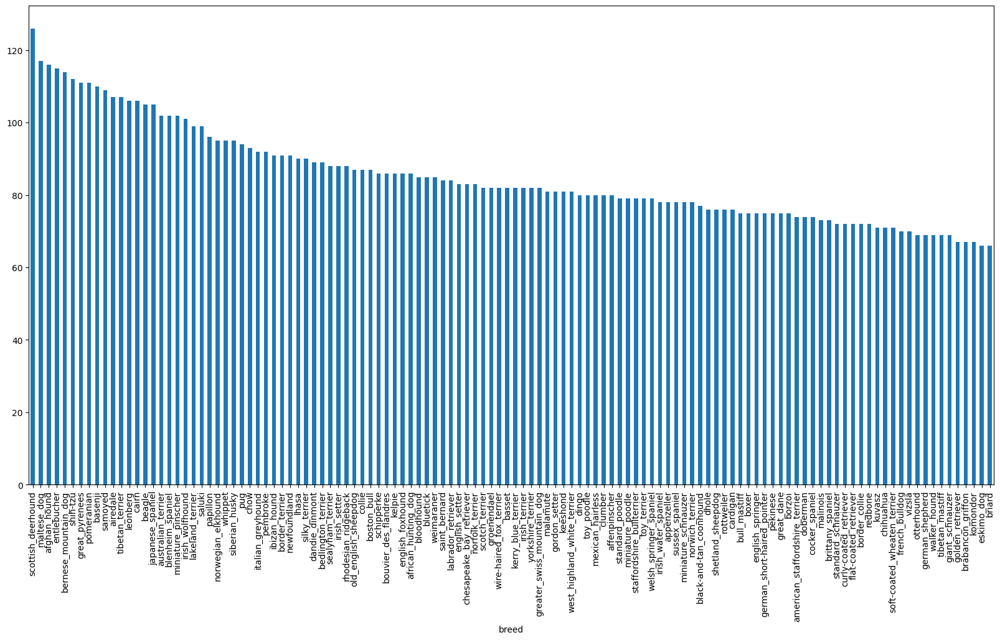

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

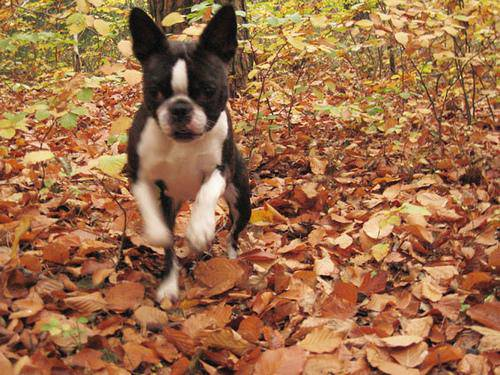

In [6]:
from IPython.display import Image
Image("drive/My Drive/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [7]:
filenames = ["drive/My Drive/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]


In [8]:
import os

In [9]:
labels = labels_csv["breed"].to_numpy()
len(labels)

10222

In [10]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [11]:
boolean_labels = [label == unique_breeds for label in labels]

In [12]:
X = filenames
y = boolean_labels

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000}

In [13]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [14]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [15]:
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [16]:
IMG_SIZE = 224

##Function to process images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Take image file path and turns into Tensor
  '''
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [17]:
##Turns data into batches
def get_image_label(image_path, label):
  '''
  Process image and return a tuple
  '''
  image = process_image(image_path)
  return image, label

BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't suffle if it's validation data.
  '''
  if test_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [18]:
##Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

In [19]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [20]:
##Function for viewing imsge in data batch
def show_images(images, labels):
  '''
  Display a plot of 25 images.
  '''
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [21]:
IMG_SIZE

224

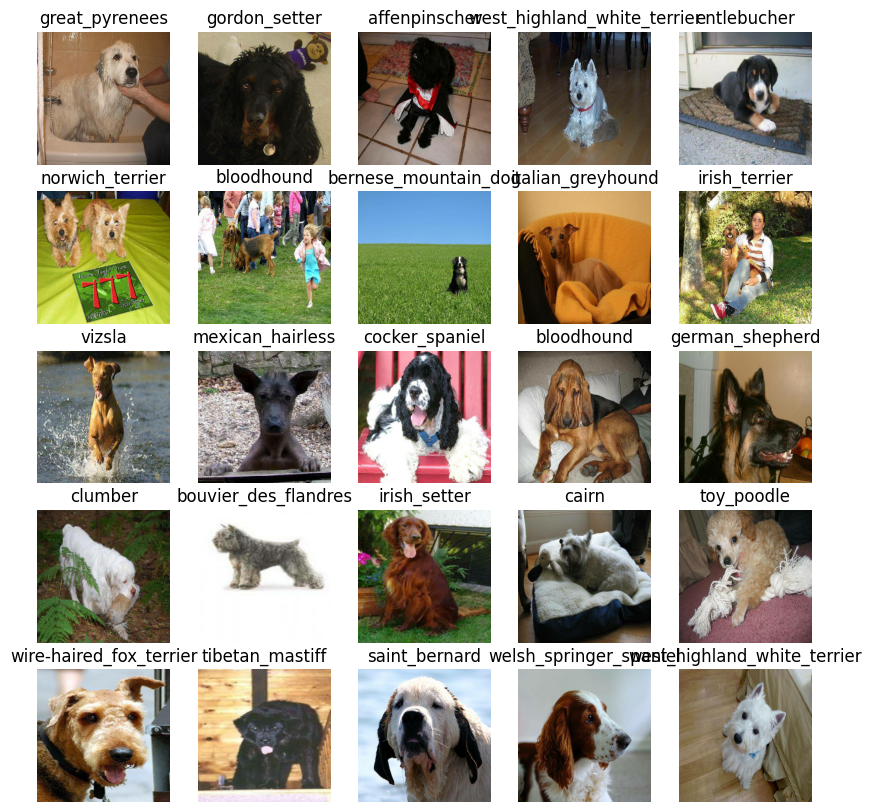

In [22]:
train_images, train_labels =  next(train_data.as_numpy_iterator())
show_images(train_images, train_labels)

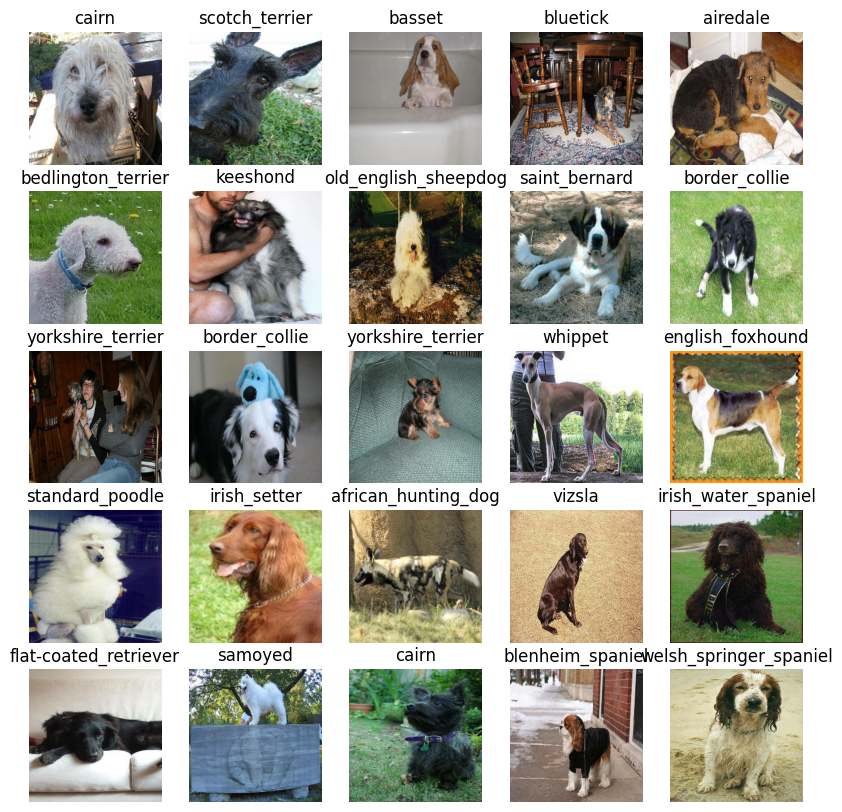

In [23]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_images(val_images, val_labels)

In [24]:
#Input/output/URL shape in Tensor form to model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1"

In [25]:
INPUT_SHAPE, OUTPUT_SHAPE

([None, 224, 224, 3], 120)

In [26]:
#Function whixh builds Karas model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  '''
  Setup the model layers, Compile model and build it.
  '''
  print("Building model")
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")
  ])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)
  return model


In [27]:
model = create_model()
model.summary()

Building model
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [28]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [29]:
import datetime
#Function to build TensorBoard callback
def create_tensorboard():
  logdir= os.path.join("drive/My Drive/dog-breed-identification/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S%"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [30]:
#early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [31]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100,step:10}

In [32]:
#Train the model
def train_model():
  '''
  Trains a given model and returns the trained model version.
  '''
  model = create_model()
  tensorboard = create_tensorboard()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Building model
Epoch 1/100
25/25 [==============================] - 155s 6s/step - loss: 4.4632 - accuracy: 0.1050 - val_loss: 3.3360 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 148ms/step - loss: 1.5612 - accuracy: 0.7188 - val_loss: 2.0834 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 4s 142ms/step - loss: 0.5249 - accuracy: 0.9538 - val_loss: 1.6364 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 5s 213ms/step - loss: 0.2361 - accuracy: 0.9887 - val_loss: 1.4489 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 4s 141ms/step - loss: 0.1370 - accuracy: 0.9962 - val_loss: 1.3800 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 179ms/step - loss: 0.0963 - accuracy: 1.0000 - val_loss: 1.3339 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================] - 4s 140ms/step - loss: 0.0717 - accuracy: 1.0000 - val_loss: 1.3019 - val_ac

In [ ]:
%tensorboard --logdir drive/My\ Drive/dog-breed-identification/logs

<IPython.core.display.Javascript object>

In [33]:
#Predictions on validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 23s 3s/step


array([[0.00967828, 0.03687481, 0.01571118, ..., 0.00058636, 0.00793816,
        0.00062609],
       [0.00636554, 0.00705706, 0.00072156, ..., 0.00056504, 0.0097909 ,
        0.00268704],
       [0.00048224, 0.07429574, 0.00254775, ..., 0.00301893, 0.00267065,
        0.02051357],
       ...,
       [0.00211673, 0.02169362, 0.02390278, ..., 0.00782213, 0.00371901,
        0.0027592 ],
       [0.00099184, 0.01507014, 0.02620675, ..., 0.01531431, 0.00433139,
        0.00355859],
       [0.00464248, 0.00416279, 0.00023431, ..., 0.00400612, 0.0007108 ,
        0.00267627]], dtype=float32)

In [34]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[0.00058007 0.03822302 0.01564297 0.00216472 0.01284671 0.00215578
 0.00479031 0.00295796 0.01114363 0.00045825 0.00463892 0.0034198
 0.00110572 0.00077276 0.02825207 0.01848142 0.00321448 0.01355507
 0.00622324 0.00149199 0.00394369 0.00252558 0.00679925 0.00745954
 0.00447145 0.00310424 0.03216706 0.00120457 0.00643827 0.00274888
 0.00343111 0.00130992 0.00042287 0.00096035 0.00077171 0.00209277
 0.00209152 0.0022826  0.00600426 0.0041507  0.03436052 0.01447472
 0.00560083 0.00183546 0.00335552 0.04731334 0.00467074 0.00657369
 0.00819408 0.00081447 0.00043723 0.00575224 0.00678709 0.01075129
 0.00161778 0.00096808 0.00181542 0.14856118 0.00190198 0.00080078
 0.00373432 0.00363214 0.0113731  0.0043732  0.0034938  0.00037712
 0.00732688 0.0035415  0.04528025 0.05318381 0.0028752  0.00308813
 0.00345367 0.00130306 0.00350762 0.00684266 0.00822279 0.00200398
 0.00769385 0.00536297 0.00516372 0.00175289 0.00303353 0.00202481
 0.00146121 0.0015217  0.00442149 0.01096077 0.00534773 0.00235

In [35]:
#Turn predictions probabilities into their respective label
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of predition probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[81])
pred_label


'english_springer'

In [36]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [37]:
def unbatchify(data):
  '''
  Takes a batched dataset of Tensors and returns separate arrays of images and labels.
  '''
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [38]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Prediction with colors(wrong/right)
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass


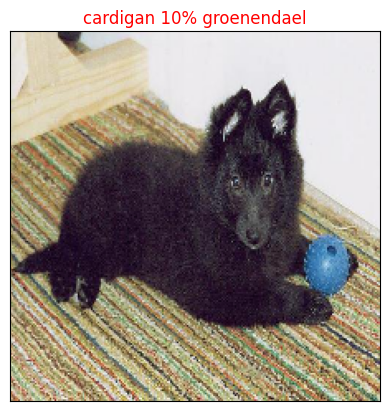

In [39]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [40]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_label = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_label)),
                                top_10_pred_values,
                                color="grey")
  plt.xticks(np.arange(len(top_10_pred_label)),
             labels=top_10_pred_label,
             rotation="vertical")
  if np.isin(true_label, top_10_pred_label):
    top_plot[np.argmax(top_10_pred_label == true_label)].set_color("green")
  else:
    pass

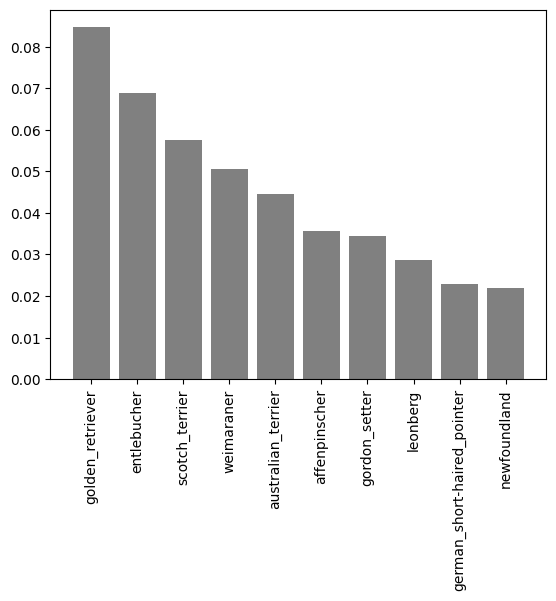

In [41]:
plot_pred_conf(prediction_probabilities= predictions,
               labels= val_labels,
               n= 9)

In [42]:
print(f"Size of predictions: {len(predictions)}")
print(f"Size of val_labels: {len(val_labels)}")

Size of predictions: 200
Size of val_labels: 200


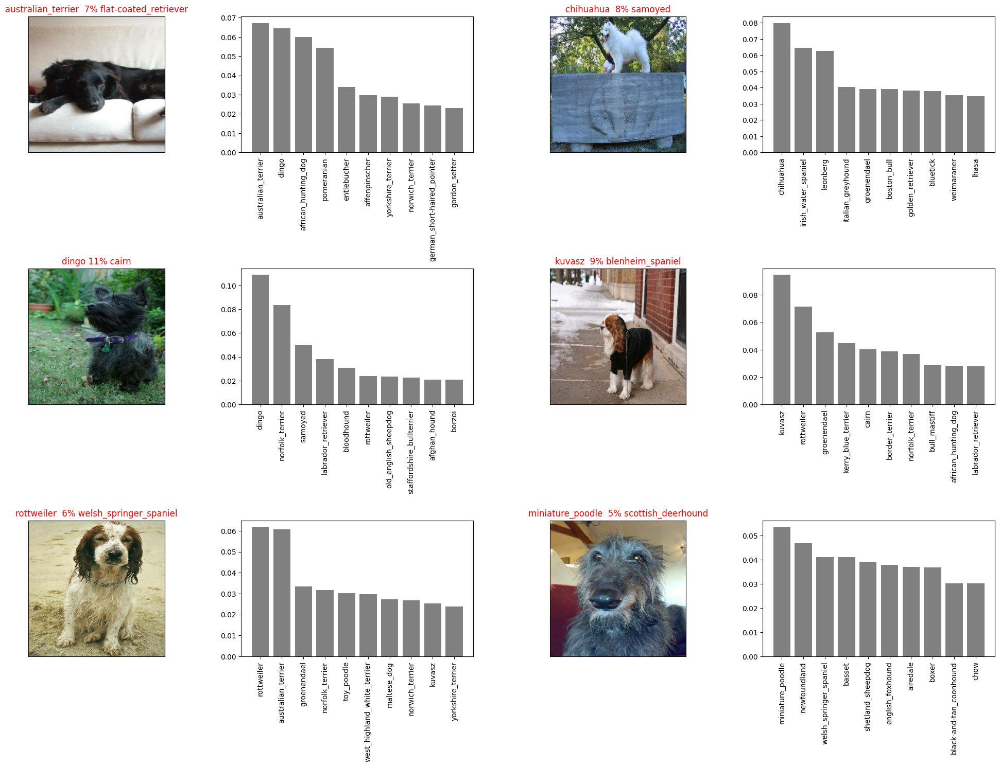

In [43]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [44]:
# Function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix (string).
  '''
  modeldir = os.path.join("drive/My Drive/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [45]:
# Function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [55]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/dog-breed-identification/models/20240415-17341713202489-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog-breed-identification/models/20240415-17341713202489-1000-images-mobilenetv2-Adam.h5'

In [46]:
model.evaluate(val_data)

7/7 [==============================] - 3s 98ms/step - loss: 6.0210 - accuracy: 0.0000e+00


[6.020995616912842, 0.0]

In [47]:
#Training model
len(X), len(y)

(10222, 10222)

In [48]:
full_data = create_data_batches(X, y)
full_model = create_model()

Building model


In [49]:
full_model_tensorboard = create_tensorboard()
full_model_earlystopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)


In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_earlystopping])


Epoch 1/100
320/320 [==============================] - 1455s 5s/step - loss: 1.3422 - accuracy: 0.6683
Epoch 2/100
320/320 [==============================] - 43s 134ms/step - loss: 0.4014 - accuracy: 0.8796
Epoch 3/100
320/320 [==============================] - 43s 132ms/step - loss: 0.2372 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1539 - accuracy: 0.9623
Epoch 5/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1071 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0795 - accuracy: 0.9856
Epoch 7/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0595 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0472 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0391 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 44s 136ms

In [56]:
loaded_full_model = load_model('drive/My Drive/dog-breed-identification/models/20240415-17341713202489-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/dog-breed-identification/models/20240415-17341713202489-1000-images-mobilenetv2-Adam.h5


In [61]:
#Predictions on test dataset
test_path = "drive/My Drive/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]
len(test_filenames)

6090

In [62]:
test_data = create_data_batches(test_filenames, test_data=True)
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [63]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

191/191 [==============================] - 128s 652ms/step


In [64]:
#Custom image predictions
custom_path = "drive/My Drive/dog-breed-identification/my-dog/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [65]:
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [66]:
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 1s 1s/step


(1, 120)

In [67]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['english_springer']

In [68]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

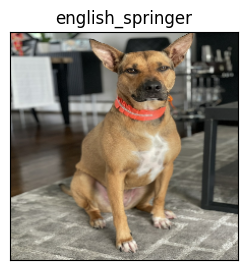

In [69]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)